In [69]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns

import pickle

from statsmodels.tsa.seasonal import seasonal_decompose

from yellowbrick.regressor import CooksDistance
from yellowbrick.regressor import ResidualsPlot

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, mean_absolute_percentage_error
from sklearn.multioutput import MultiOutputRegressor
from sklearn.pipeline import Pipeline

color_pal = sns.color_palette()
plt.style.use('fivethirtyeight')

In [3]:
df = pd.read_csv('open_meteo.csv')
df.head(1)

,time,weathercode,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,sunrise,sunset,...,precipitation_hours,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,et0_fao_evapotranspiration,latitude,longitude,elevation,country,city
0,2010-01-01,1,30.3,17.2,23.5,31.5,17.7,23.9,2010-01-01T00:04,2010-01-01T11:13,...,0.0,9.3,18.7,316,4.14,16.800003,96.20001,12.0,Myanmar,Yangoon


In [15]:
df['time'] = pd.to_datetime(df['time'])
df['year'] = df['time'].dt.year
df['month'] = df['time'].dt.month
df['weekofyear'] = df['time'].dt.isocalendar().week
df['weekday'] = df['time'].dt.weekday
df['dayofyear'] = df['time'].dt.dayofyear
df['dayofweek'] = df['time'].dt.dayofweek

df['weekofyear'] = df['weekofyear'].astype('int32')

df['sunset'] = pd.to_datetime(df['sunset'])
df['sunset_hour'] = df['sunset'].dt.hour
df['sunset_year'] = df['sunset'].dt.year
df['sunset_month'] = df['sunset'].dt.month
df['sunset_weekofyear'] = df['sunset'].dt.isocalendar().week
df['sunset_weekday'] = df['sunset'].dt.weekday

df['sunset_weekofyear'] = df['sunset_weekofyear'].astype('int32')

df['sunrise'] = pd.to_datetime(df['sunrise'])
df['sunrise_hour'] = df['sunrise'].dt.hour
df['sunrise_year'] = df['sunrise'].dt.year
df['sunrise_month'] = df['sunrise'].dt.month
df['sunrise_weekofyear'] = df['sunrise'].dt.isocalendar().week
df['sunrise_weekday'] = df['sunrise'].dt.weekday

df['sunrise_weekofyear'] = df['sunrise_weekofyear'].astype('int32')

seasons = {
            (11, 12, 1, 2): 'Winter', 
            (3, 4):'Summer', 
            (5, 6, 7, 8, 9, 10): 'Monsoon'
}
for months, season in seasons.items():
    df.loc[df['month'].isin(months), 'season'] = season

In [9]:
df.groupby('city')['temperature_2m_mean'].describe()

,count,mean,std,min,25%,50%,75%,max
city,,,,,,,,
Hpa-An,4916.0,26.737185,2.030246,16.1,25.200,26.6,28.0,33.2
Keng Tung,4916.0,23.063995,3.146649,4.7,21.100,23.4,25.1,32.0
Laukkaing,4916.0,21.040297,3.402065,9.9,18.400,21.8,23.5,30.2
Magway,4916.0,26.662551,3.176037,17.7,24.800,26.8,28.4,35.2
Mandalay,4916.0,26.550732,3.575432,16.6,24.075,27.1,28.9,36.5
Maungdaw,4916.0,25.699939,2.482776,17.7,24.400,26.2,27.3,31.3
Myeik,4916.0,26.691863,1.353265,20.2,25.700,26.7,27.6,31.1
Nay Pyi Taw,4916.0,25.772213,2.935665,17.3,24.100,25.6,27.2,35.2
Taunggyi,4916.0,19.297579,2.556477,9.5,17.600,19.8,20.9,27.3


In [10]:
print(df.groupby('city')['temperature_2m_mean'].skew())
print(df.groupby('city')['temperature_2m_mean'].apply(pd.DataFrame.kurt))

city
Hpa-An         0.317043
Keng Tung     -0.520136
Laukkaing     -0.439830
Magway        -0.090404
Mandalay      -0.254768
Maungdaw      -0.683899
Myeik          0.159159
Nay Pyi Taw    0.260540
Taunggyi      -0.394814
Yangoon        0.443972
Name: temperature_2m_mean, dtype: float64
city
Hpa-An         0.303334
Keng Tung      0.885567
Laukkaing     -0.445035
Magway        -0.267394
Mandalay      -0.391827
Maungdaw      -0.085918
Myeik          0.116393
Nay Pyi Taw    0.165918
Taunggyi       0.002094
Yangoon        0.705655
Name: temperature_2m_mean, dtype: float64


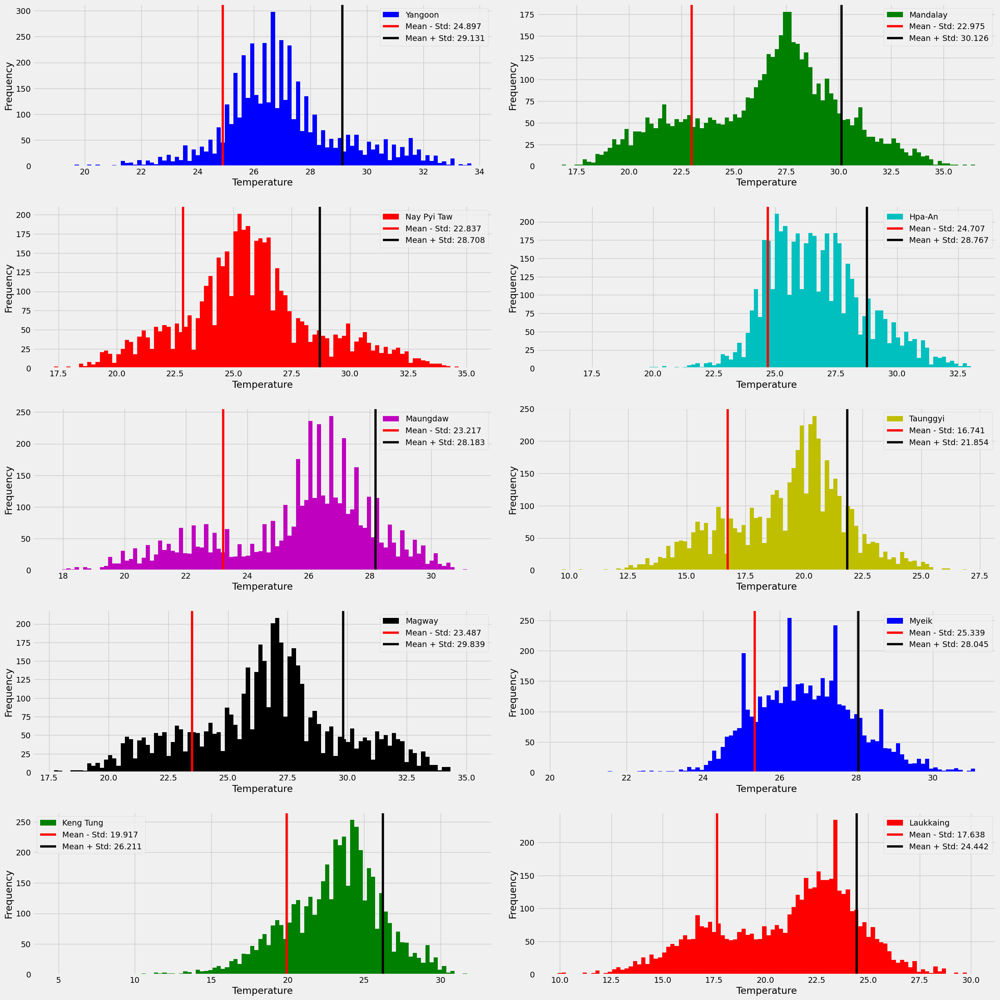

In [7]:
fig, ax = plt.subplots(5, 2, figsize=(25, 25))
i = 0
colors = ["b",'g','r','c','m','y','k']
cities = df['city'].unique()
for city in cities: 
    mean_ = df[df['city'] == city]['temperature_2m_mean'].mean()
    std_ = df[df['city'] == city]['temperature_2m_mean'].std()
    df[df['city'] == city]['temperature_2m_mean'].hist(bins=100, ax=ax[i//2][i%2], color=colors[i%len(colors)], label=city)
    ax[i//2][i%2].axvline(mean_ - std_, color='red', label=f"Mean - Std: {np.round(mean_ - std_, 3)}")
    ax[i//2][i%2].axvline(mean_ + std_, color='black', label=f"Mean + Std: {np.round(mean_ + std_, 3)}")
    ax[i//2][i%2].set_xlabel('Temperature')
    ax[i//2][i%2].set_ylabel('Frequency')
    ax[i//2][i%2].legend()
    i += 1
plt.tight_layout(pad=2)
plt.show()

As we can see from the charts, temperature distribution varies across cities, indicating that there are different climatic factors affecting each location. Some histograms are skewed to the right, such as Hpa-An, Maungdaw and Myeik, meaning that they have more low-temperature values and a few high-temperature extremes. Some histograms are more symmetric, such as Yangoon and Keng Thung, meaning that they have a more balanced distribution of temperature values around the mean. Some histograms have more variability, such as Laukkaing and Mandalay, meaning that they have a wider range of temperature values and a larger standard deviation.

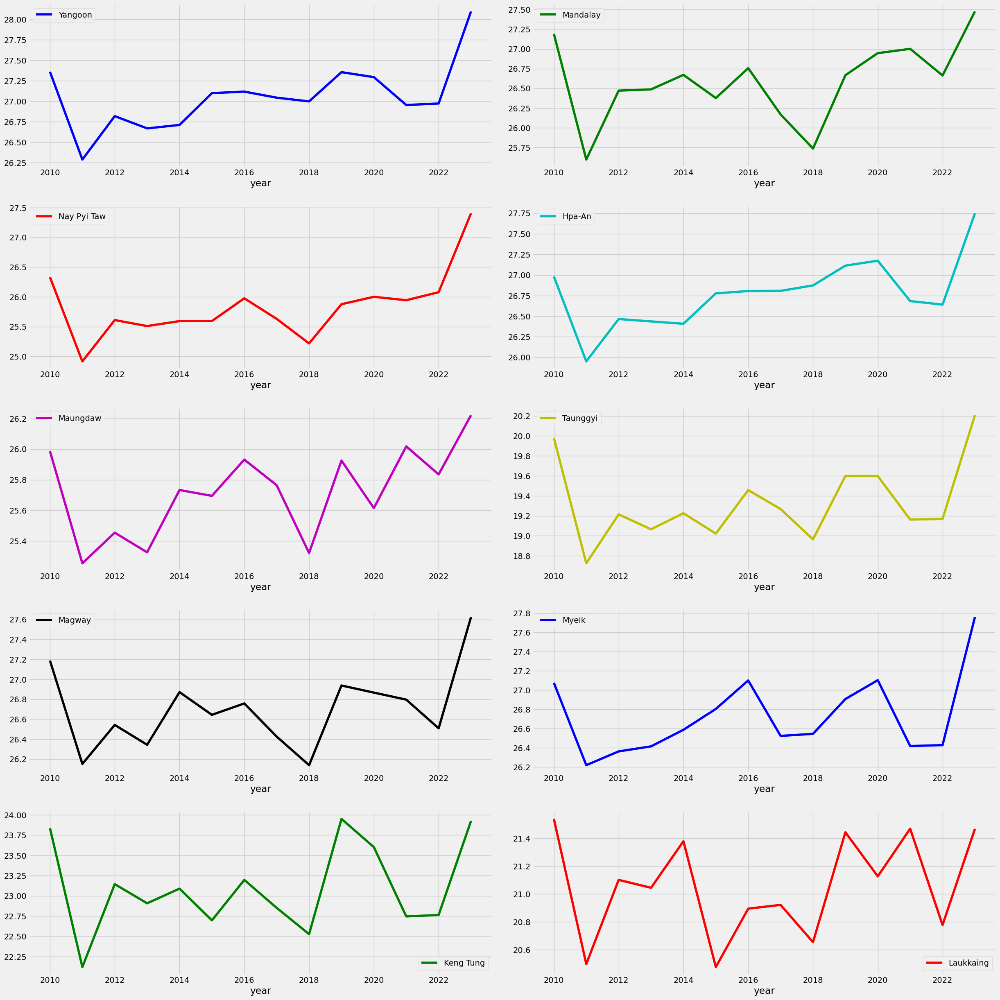

In [11]:
fig, ax = plt.subplots(5, 2, figsize=(25, 25))
i = 0
colors = ["b",'g','r','c','m','y','k']
cities = df['city'].unique()
for city in cities: 
    df[df['city'] == city].groupby('year')['temperature_2m_mean'].mean().plot(ax=ax[i//2][i%2], color=colors[i%len(colors)], label=city)
    ax[i//2][i%2].legend()
    i += 1
plt.tight_layout(pad=2)
plt.show()

As we can see from the lineplot temperature has high highs and troughs with somewhat an increasing trend in some cities. Temperature over the years varies from city to city indicating a presence of seasonality.

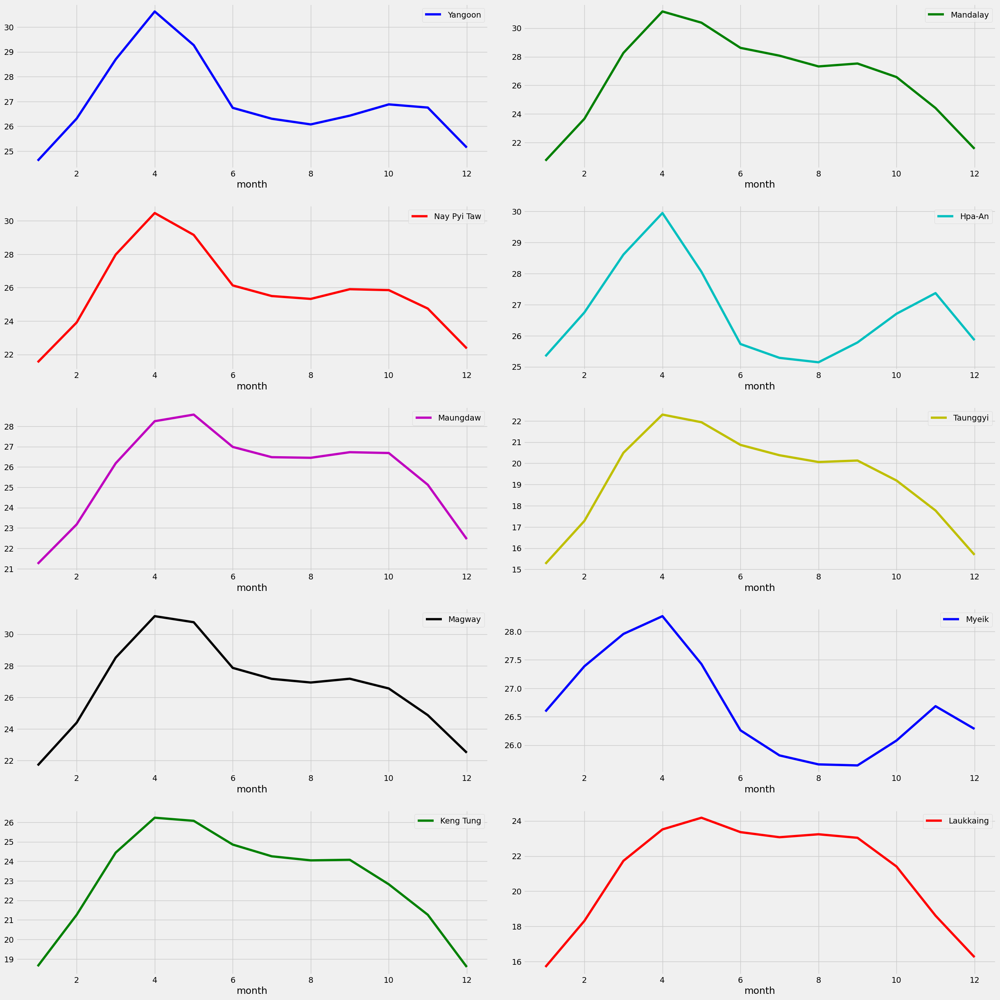

In [13]:
fig, ax = plt.subplots(5, 2, figsize=(25, 25))
i = 0
colors = ["b",'g','r','c','m','y','k']
cities = df['city'].unique()
for city in cities: 
    df[df['city'] == city].groupby('month')['temperature_2m_mean'].mean().plot(ax=ax[i//2][i%2], color=colors[i%len(colors)], label=city)
    ax[i//2][i%2].legend()
    i += 1
plt.tight_layout(pad=2)
plt.show()

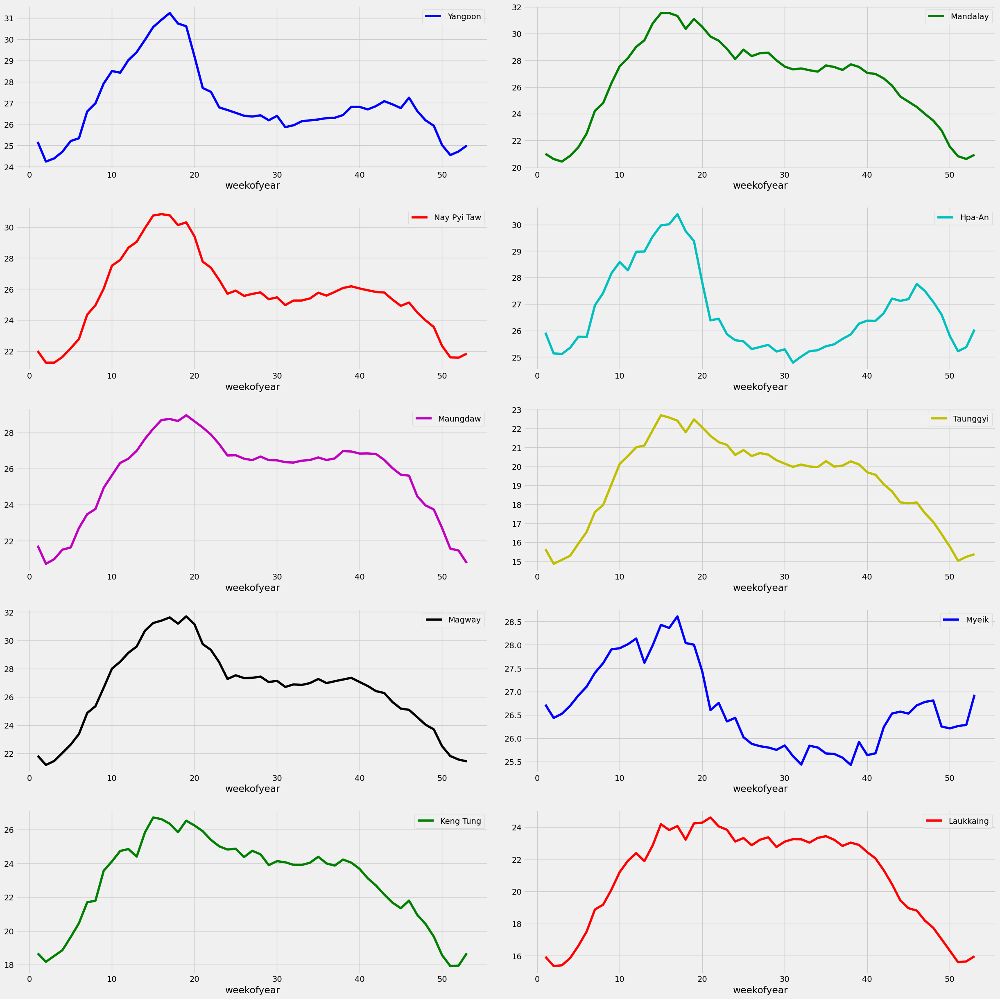

In [17]:
fig, ax = plt.subplots(5, 2, figsize=(25, 25))
i = 0
colors = ["b",'g','r','c','m','y','k']
cities = df['city'].unique()
for city in cities: 
    df[df['city'] == city].groupby('weekofyear')['temperature_2m_mean'].mean().plot(ax=ax[i//2][i%2], color=colors[i%len(colors)], label=city)
    ax[i//2][i%2].legend()
    i += 1
plt.tight_layout(pad=2)
plt.show()

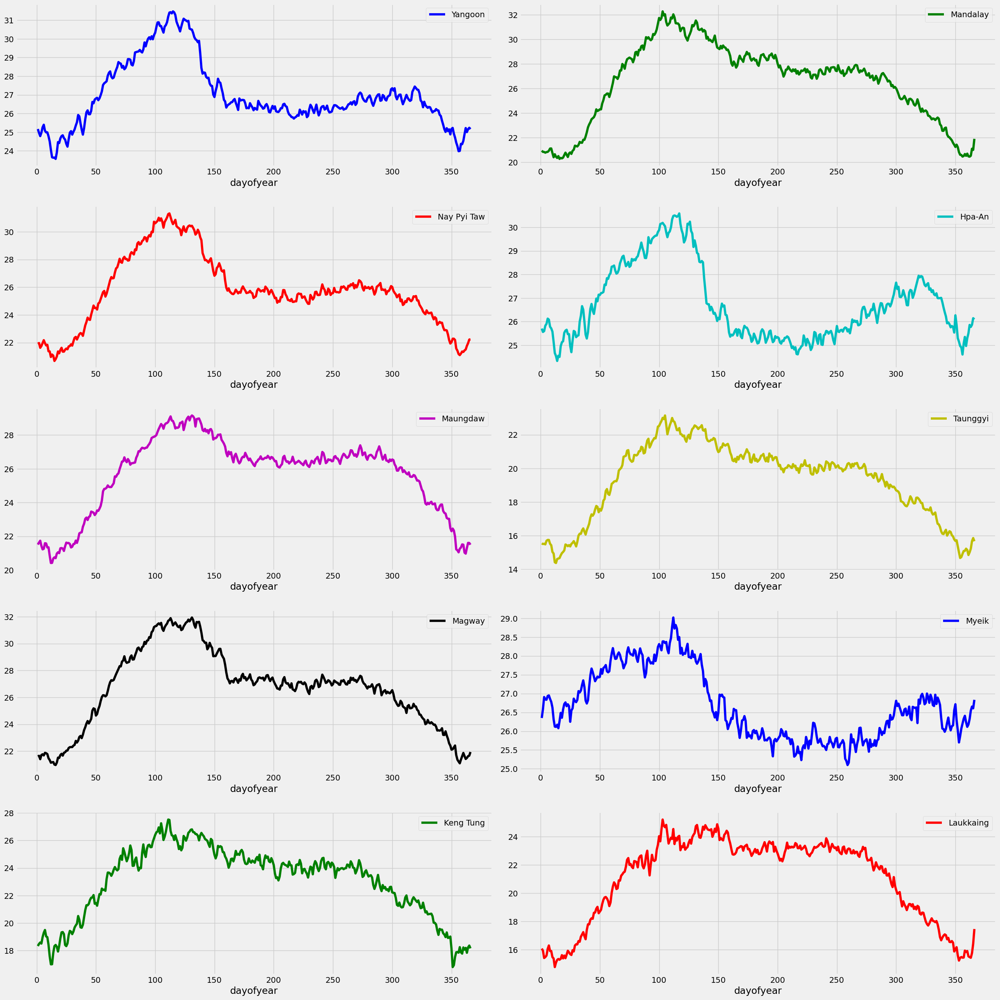

In [18]:
fig, ax = plt.subplots(5, 2, figsize=(25, 25))
i = 0
colors = ["b",'g','r','c','m','y','k']
cities = df['city'].unique()
for city in cities: 
    df[df['city'] == city].groupby('dayofyear')['temperature_2m_mean'].mean().plot(ax=ax[i//2][i%2], color=colors[i%len(colors)], label=city)
    ax[i//2][i%2].legend()
    i += 1
plt.tight_layout(pad=2)
plt.show()

As we can see from the above plots, there is a seasonal trend in the data. Either we can model this dataset as it is or we can detrend this data before passing it to the model.

City: Yangoon
City: Mandalay
City: Nay Pyi Taw
City: Hpa-An
City: Maungdaw
City: Taunggyi
City: Magway
City: Myeik
City: Keng Tung
City: Laukkaing


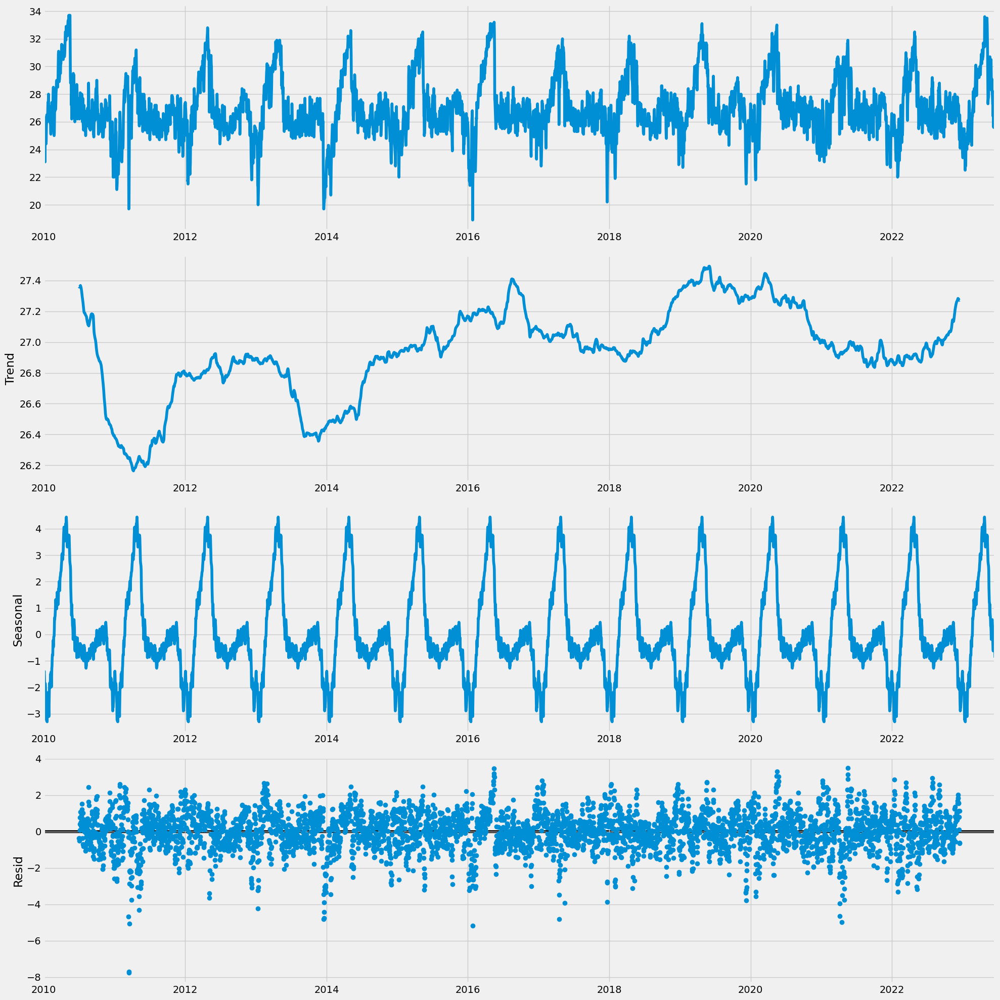

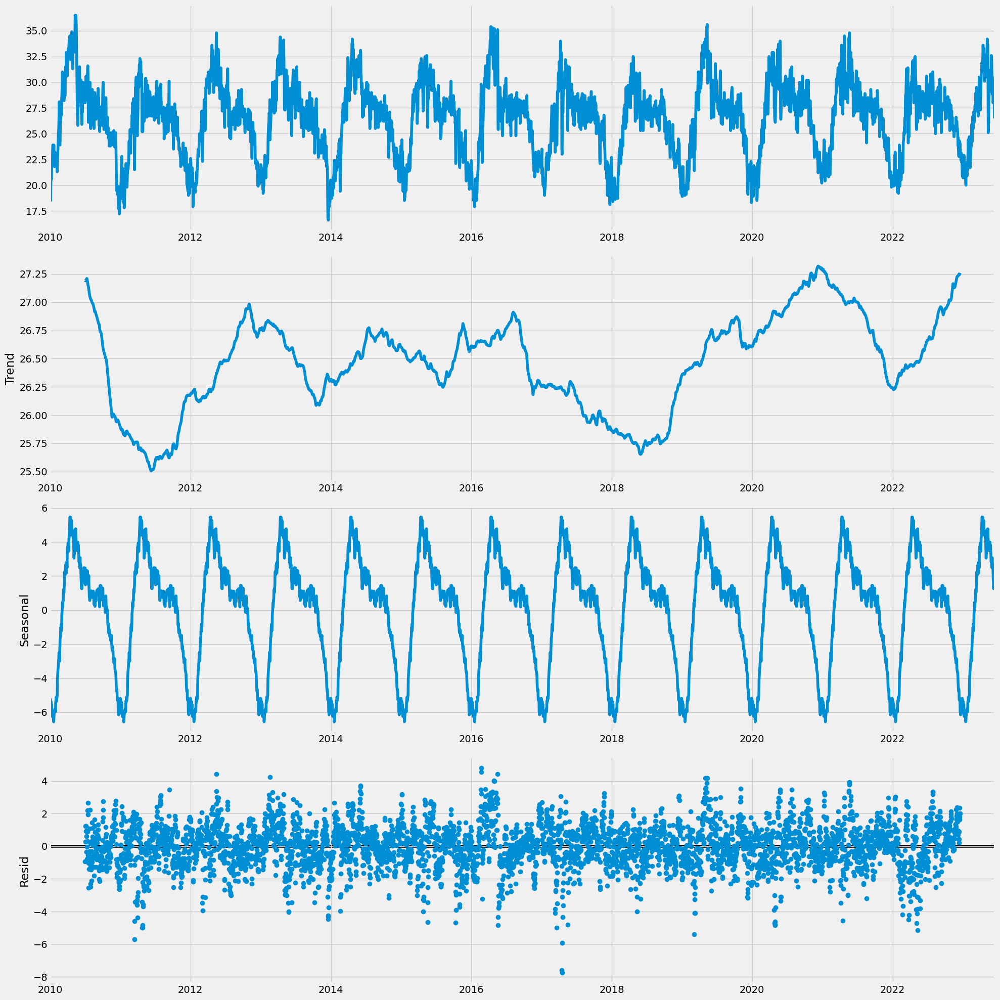

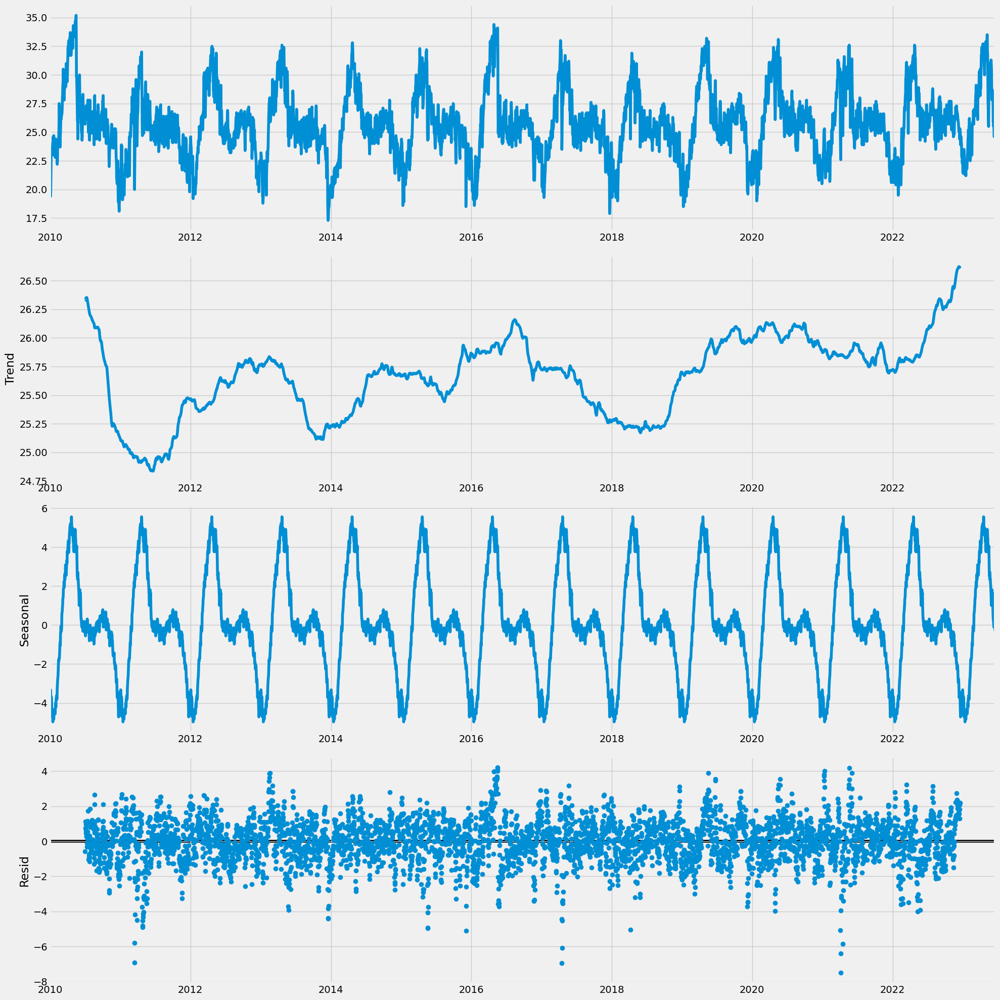

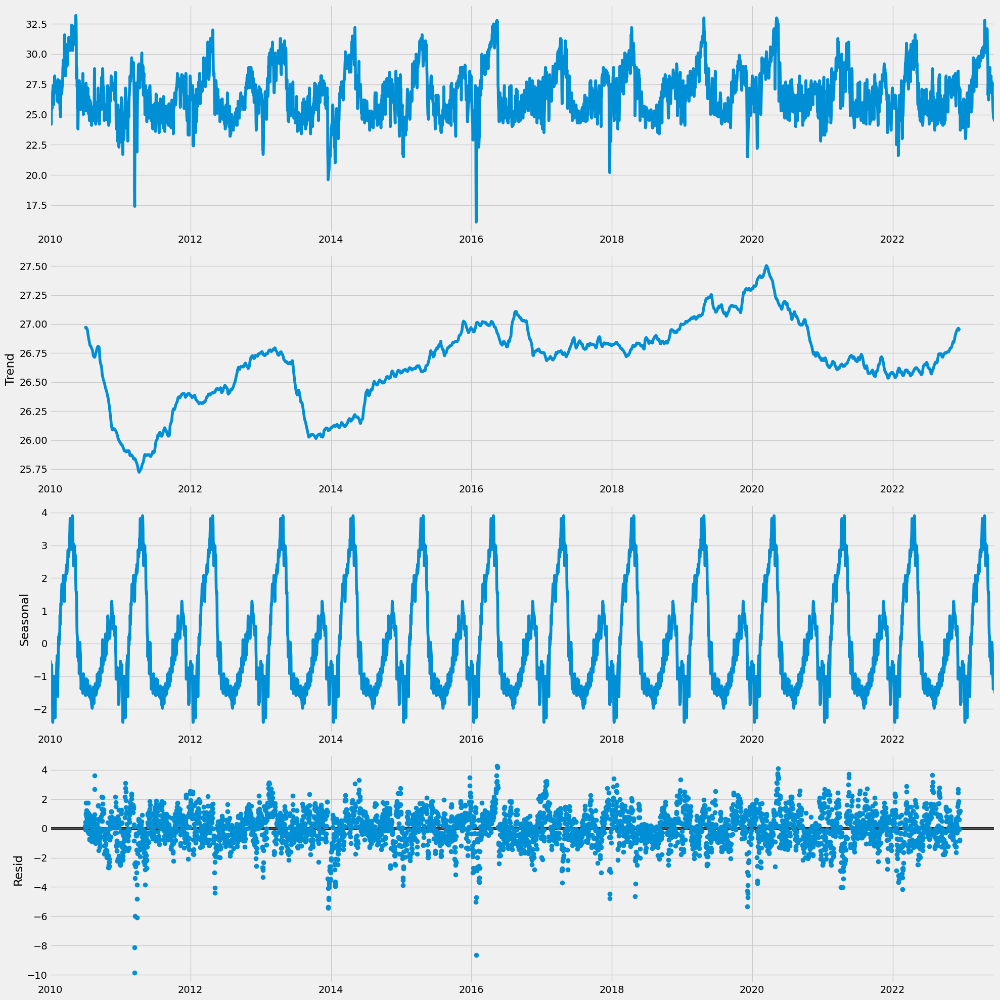

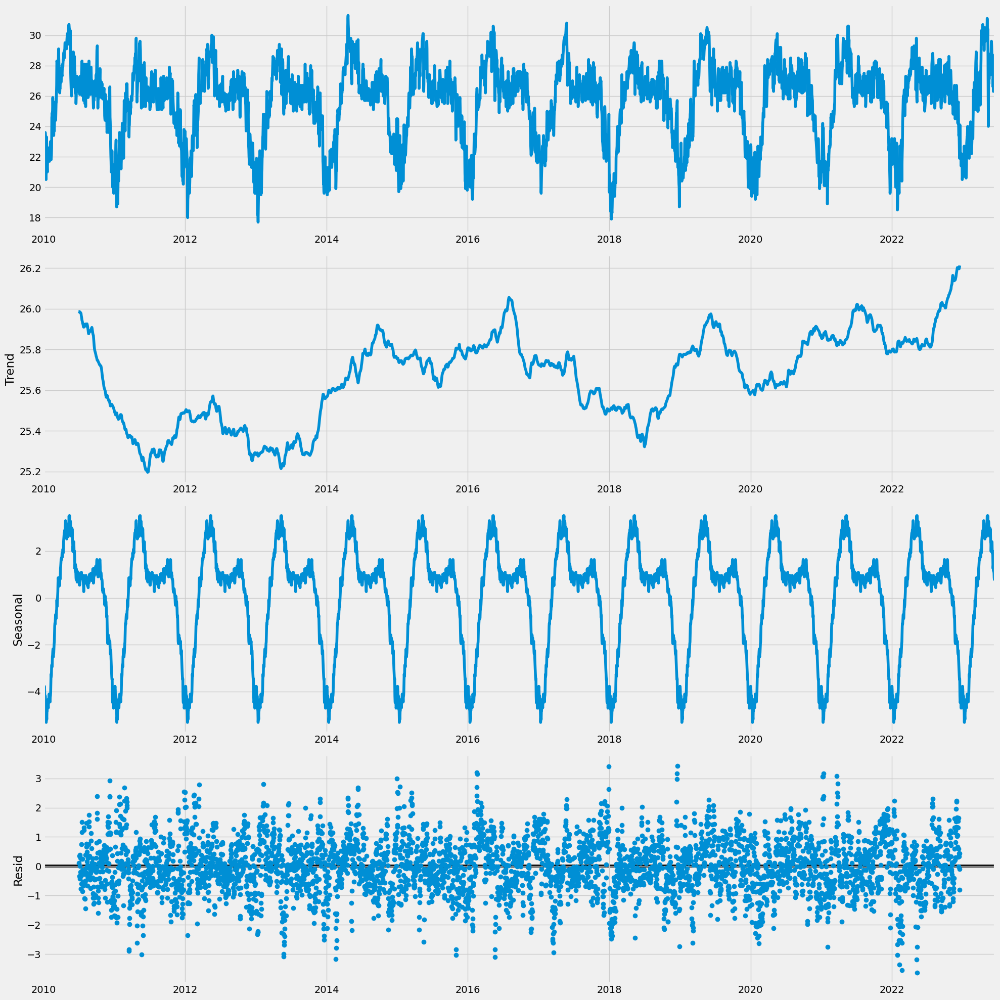

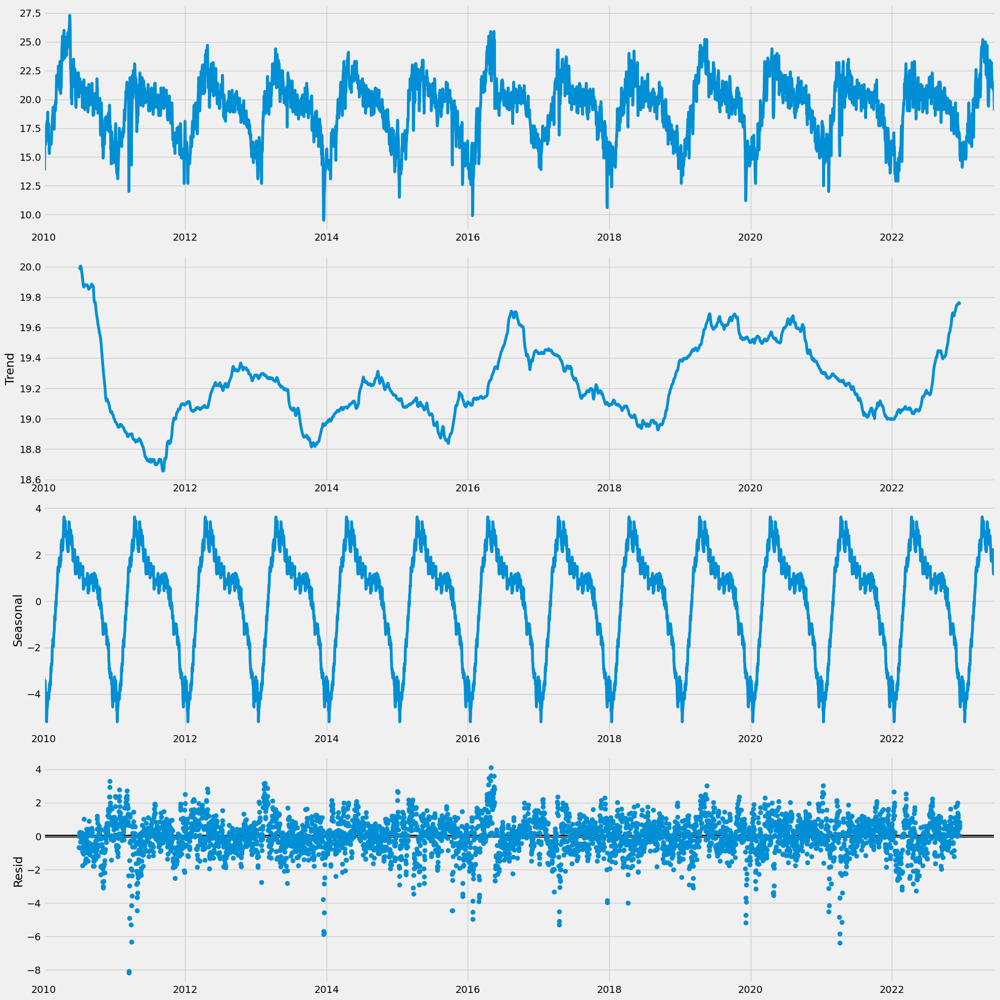

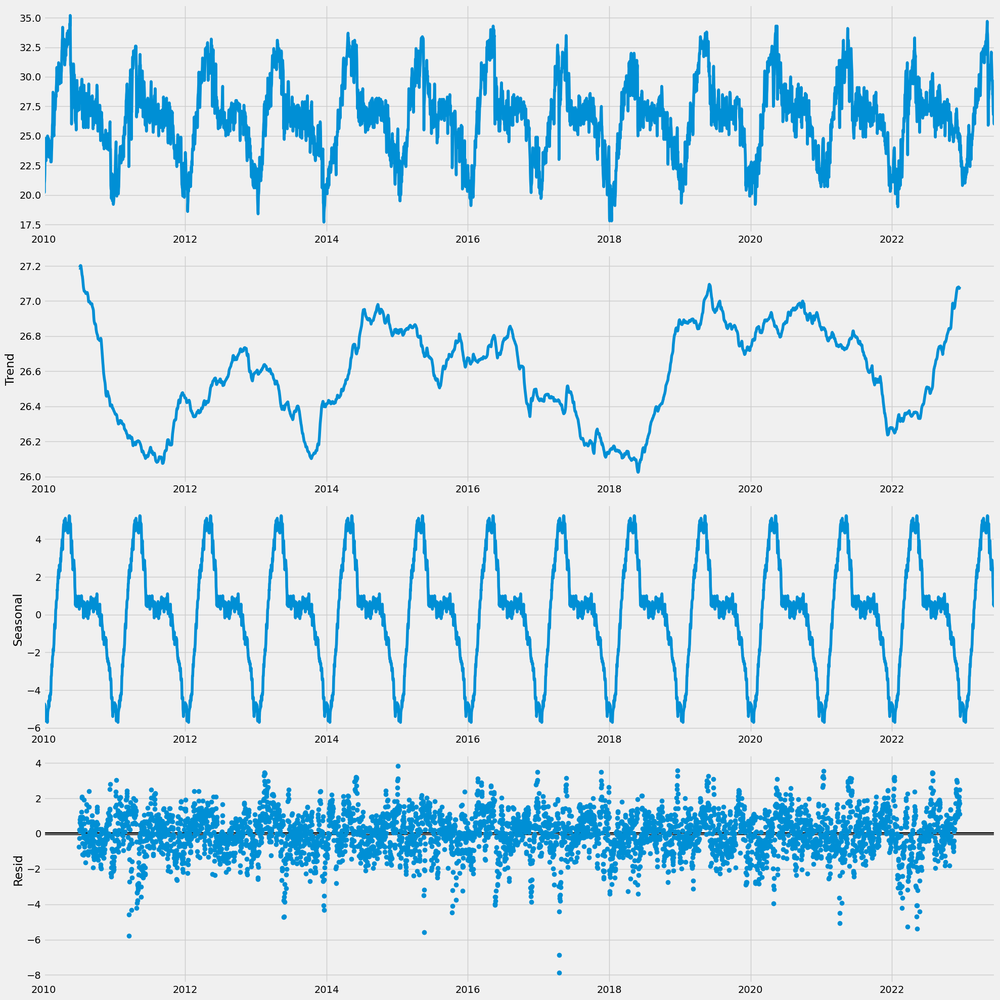

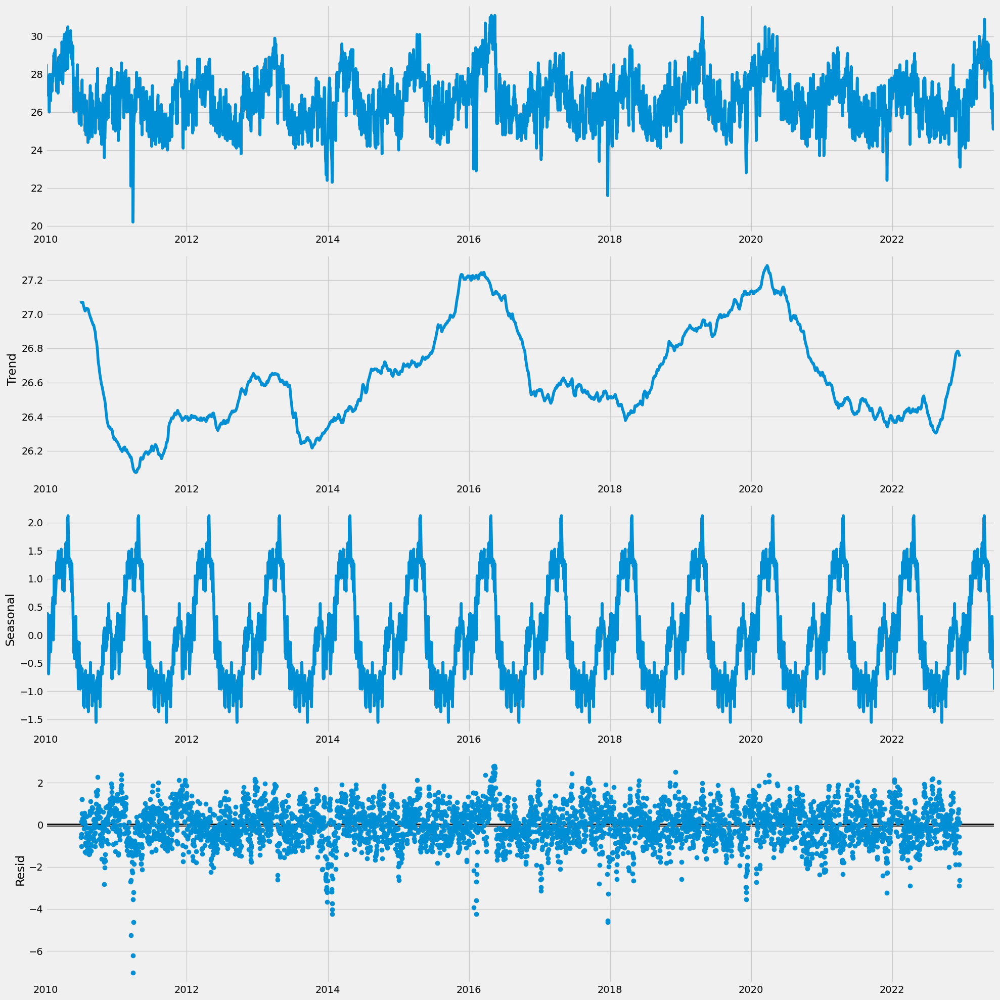

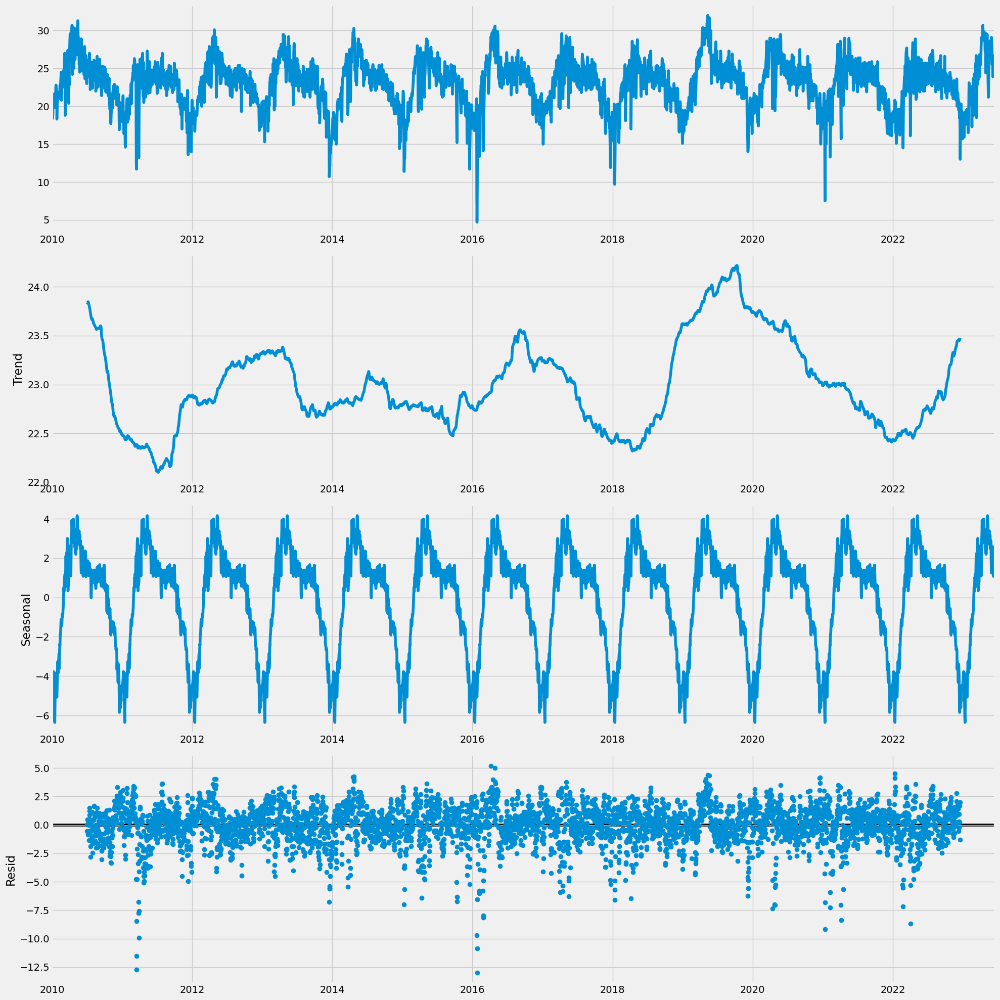

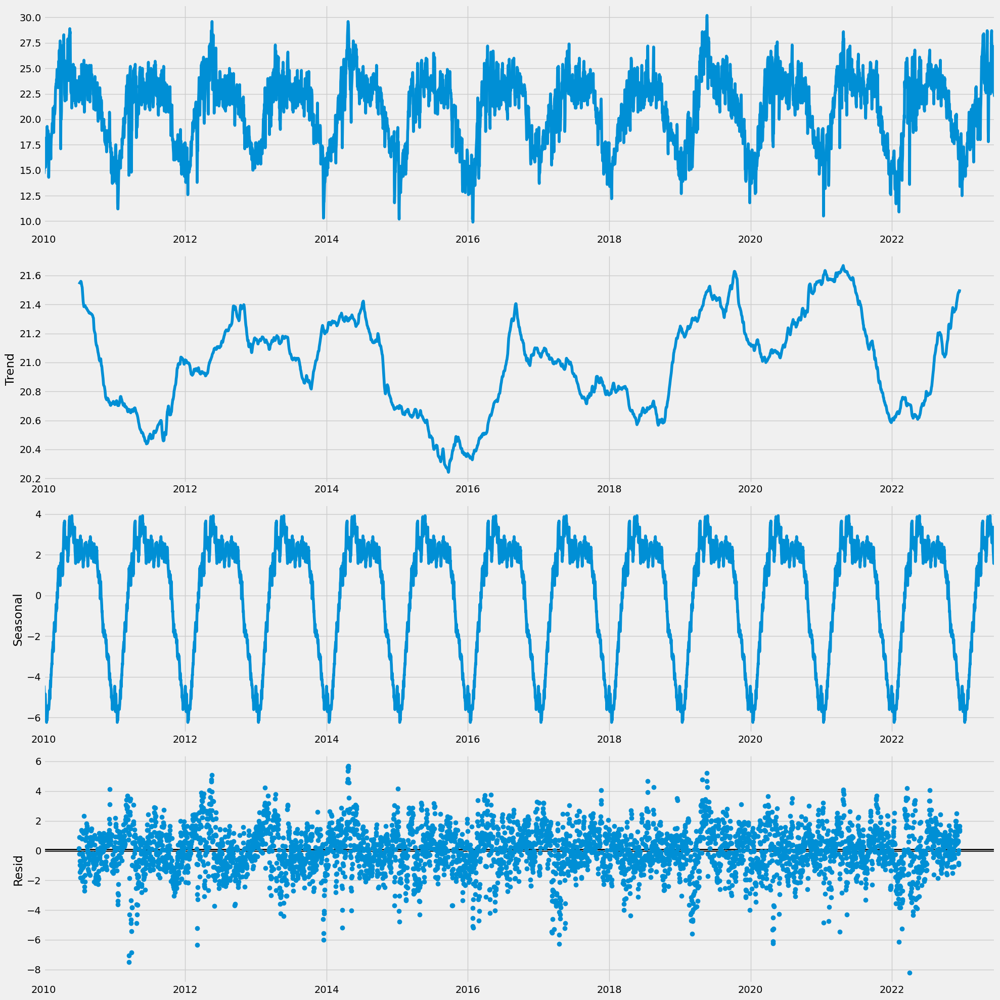

In [30]:
plt.rc("figure",figsize=(20,20))
cities = df['city'].unique()
for city in cities: 
    decomp_df = df.loc[df['city'] == city, ['temperature_2m_mean', 'time']]
    decomp_df = decomp_df.set_index('time')
    decomposition = seasonal_decompose(decomp_df, period=int(365))
    print(f"City: {city}")
    decomposition.plot()

The trend component line shows there are increasing trend indicates a general upward movement in the series over time and decreasing trend indicates a general downward movement. The seasonal component shows the repeated patterns within a year. You can observe the regular cycles or fluctuations that occur annually. We can observe highs during summer seasons and lows during winter seasons. From the above seasonal decomposition chart we can conclude that there are definetly seasonality in the dataset. 

In [33]:
scaler = StandardScaler()
model = LinearRegression()
encoder = LabelEncoder()
regr = MultiOutputRegressor(model)

In [38]:
df.select_dtypes(include='object')

,country,city,season
0,Myanmar,Yangoon,Winter
1,Myanmar,Yangoon,Winter
2,Myanmar,Yangoon,Winter
3,Myanmar,Yangoon,Winter
4,Myanmar,Yangoon,Winter
...,...,...,...
49155,Myanmar,Laukkaing,Monsoon
49156,Myanmar,Laukkaing,Monsoon
49157,Myanmar,Laukkaing,Monsoon
49158,Myanmar,Laukkaing,Monsoon


In [39]:
df['season'] = pd.factorize(df['season'])[0]
df['city'] = pd.factorize(df['city'])[0]

In [44]:
df.dropna(axis=0, inplace=True)

In [45]:
X = df.drop(['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean', 'time', 'sunrise', 'sunset', 'country',
             'snowfall_sum'], axis=1)
y = df[['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean']]

In [46]:
kfold = KFold(n_splits=5, random_state=1, shuffle=True)
for _, (i, j) in enumerate(kfold.split(X, y)):
    x_train, x_test = X.iloc[i], X.iloc[j]
    y_train, y_test = y.iloc[i], y.iloc[j]

In [47]:
pipeline = Pipeline([('scaler', scaler), ('model', regr)])
pipeline.fit(x_train, y_train)
preds = pipeline.predict(x_test)

In [66]:
mae = mean_absolute_error(preds, y_test)
r_squared = r2_score(preds, y_test)
rmse = mean_squared_error(preds, y_test, squared=False)
mape = mean_absolute_percentage_error(preds, y_test)

In [68]:
print(f"Mean Absolute Error: {mae}")
print(f"Root Mean Squared Error: {rmse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R Squared: {r_squared}")

Mean Absolute Error: 0.37074827793529375
Root Mean Squared Error: 0.48668962799225474
Mean Absolute Percentage Error: 0.015305935778424823
R Squared: 0.9848209188028552


In [50]:
X_test_copy = x_test.copy()
X_test_copy[['true_labels_1', 'true_labels_2', 'true_labels_3']] = y_test
X_test_copy[['pred_label_1', 'pred_label_2', 'pred_label_3']] = preds
X_test_copy

,weathercode,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,shortwave_radiation_sum,precipitation_sum,rain_sum,precipitation_hours,windspeed_10m_max,windgusts_10m_max,...,sunrise_weekday,season,dayofyear,dayofweek,true_labels_1,true_labels_2,true_labels_3,pred_label_1,pred_label_2,pred_label_3
9,1,35.4,23.4,29.0,18.87,0.0,0.0,0.0,7.8,20.5,...,6,0,10,6,32.2,20.7,26.0,31.961841,20.298100,25.882901
14,2,36.0,23.6,29.4,18.48,0.0,0.0,0.0,7.6,19.1,...,4,0,15,4,31.9,20.5,26.1,32.151336,20.318357,25.976189
15,2,34.9,23.6,29.7,18.85,0.0,0.0,0.0,8.9,23.8,...,5,0,16,5,31.9,20.9,26.5,32.029134,20.655679,26.622600
18,2,33.4,24.9,28.6,17.93,0.0,0.0,0.0,9.2,23.8,...,1,0,19,1,31.1,21.3,26.0,30.373119,21.379622,25.472020
20,1,35.7,23.4,29.3,19.22,0.0,0.0,0.0,9.1,22.0,...,3,0,21,3,33.1,20.9,26.9,32.623850,20.533369,26.438541
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49148,63,36.6,25.2,30.3,21.74,6.4,6.4,7.0,8.4,26.3,...,0,2,157,1,32.4,21.0,26.7,31.775791,21.643238,26.306499
49150,61,34.1,25.7,29.3,16.79,4.6,4.6,14.0,6.9,28.8,...,2,2,159,3,30.2,21.6,24.8,29.095358,21.626873,24.819305
49151,63,33.9,25.9,28.8,17.28,42.5,42.5,21.0,6.1,29.9,...,3,2,160,4,30.0,21.5,24.3,28.758324,21.830663,24.499750
49158,51,32.8,24.2,27.6,17.78,1.5,1.5,12.0,6.5,36.0,...,3,2,167,4,28.8,20.6,23.7,28.348936,20.592538,23.755473


In [51]:
X_test_copy['residual_1'] = X_test_copy['true_labels_1'] - X_test_copy['pred_label_1']
X_test_copy['residual_2'] = X_test_copy['true_labels_2'] - X_test_copy['pred_label_2']
X_test_copy['residual_3'] = X_test_copy['true_labels_3'] - X_test_copy['pred_label_3']

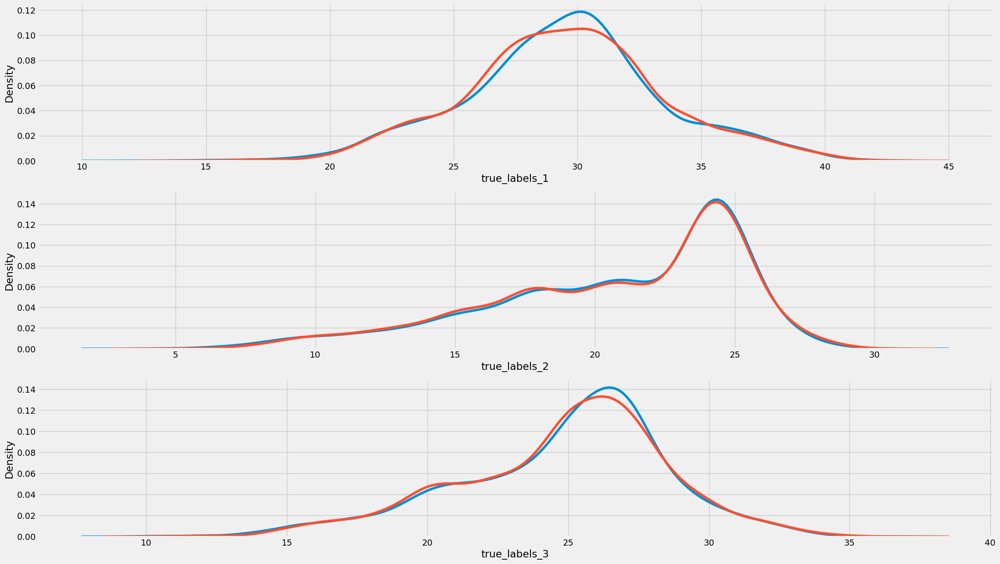

In [52]:
fig, ax = plt.subplots(3, 1, figsize=(25, 15))
sns.kdeplot(data=X_test_copy, x='true_labels_1', ax=ax[0])
sns.kdeplot(data=X_test_copy, x='pred_label_1', ax=ax[0])

sns.kdeplot(data=X_test_copy, x='true_labels_2', ax=ax[1])
sns.kdeplot(data=X_test_copy, x='pred_label_2', ax=ax[1])

sns.kdeplot(data=X_test_copy, x='true_labels_3', ax=ax[2])
sns.kdeplot(data=X_test_copy, x='pred_label_3', ax=ax[2])

plt.show()

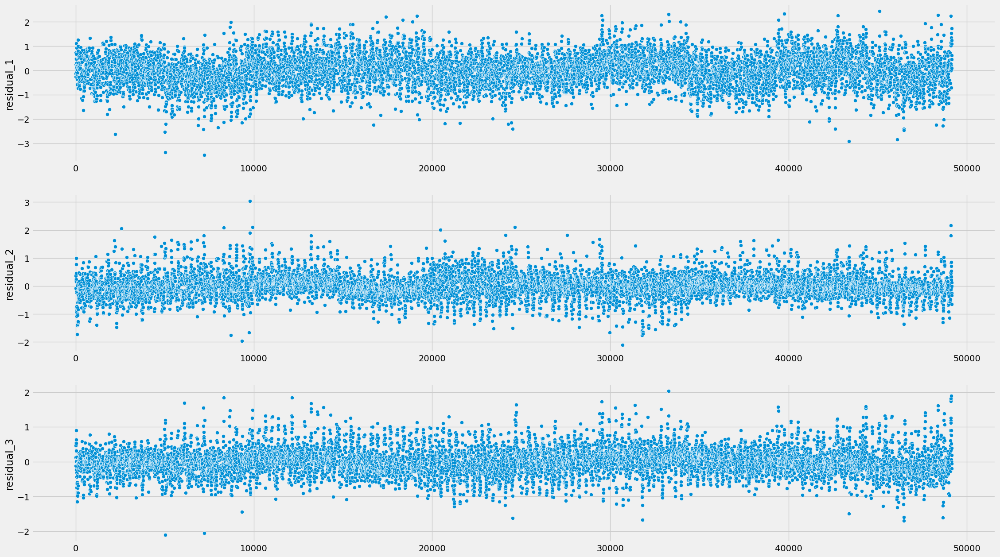

In [53]:
fig, ax = plt.subplots(3, 1, figsize=(25, 15))
sns.scatterplot(data=X_test_copy, x=X_test_copy.index, y='residual_1', ax=ax[0])
sns.scatterplot(data=X_test_copy, x=X_test_copy.index, y='residual_2', ax=ax[1])
sns.scatterplot(data=X_test_copy, x=X_test_copy.index, y='residual_3', ax=ax[2])
plt.show()

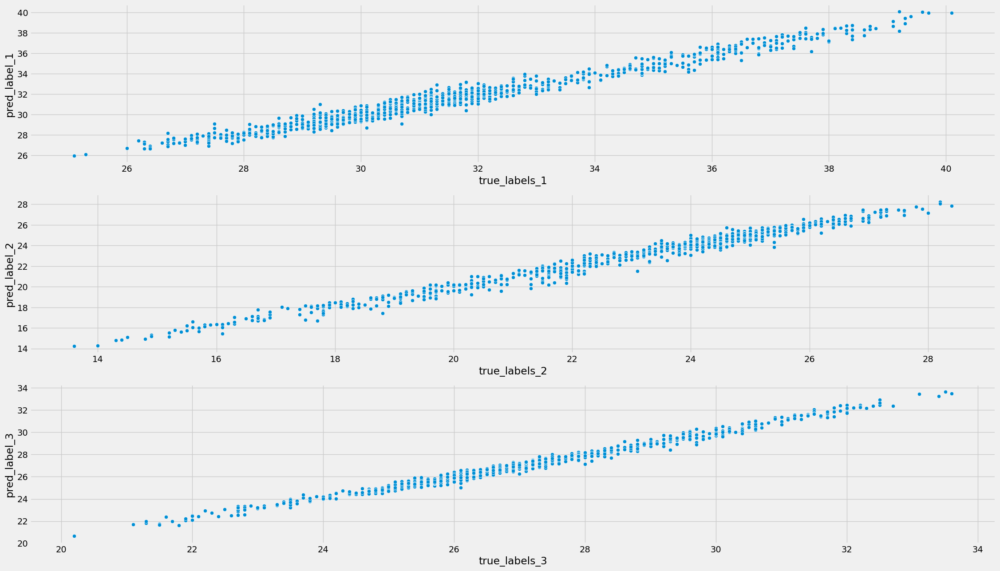

In [80]:
fig, ax = plt.subplots(3, 1, figsize=(25, 15))
sns.scatterplot(data=X_test_copy, x='true_labels_1', y='pred_label_1', ax=ax[0])
sns.scatterplot(data=X_test_copy, x='true_labels_2', y='pred_label_2', ax=ax[1])
sns.scatterplot(data=X_test_copy, x='true_labels_3', y='pred_label_3', ax=ax[2])
plt.show()

In [56]:
y_copy = y.copy()
y_copy

,temperature_2m_max,temperature_2m_min,temperature_2m_mean
0,30.3,17.2,23.5
1,30.9,16.8,23.6
2,30.7,17.7,23.5
3,30.8,17.6,24.2
4,31.4,21.0,25.8
...,...,...,...
49155,25.8,21.1,23.3
49156,26.8,20.2,22.3
49157,27.9,19.6,23.0
49158,28.8,20.6,23.7


In [57]:
y_copy.drop(['temperature_2m_max', 'temperature_2m_min'], axis=1, inplace=True)

In [58]:
y_copy = np.ravel(y_copy['temperature_2m_mean'].values.reshape(-1, 1))
y_copy

array([23.5, 23.6, 23.5, ..., 23. , 23.7, 23.9])

In [59]:
import numpy as np

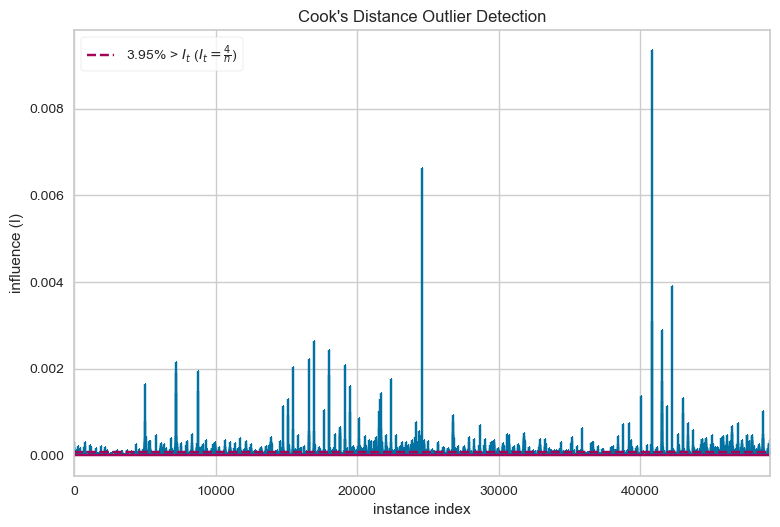

<Axes: title={'center': "Cook's Distance Outlier Detection"}, xlabel='instance index', ylabel='influence (I)'>

In [60]:
visualizer = CooksDistance()
visualizer.fit(X, y_copy)
visualizer.show()

In [61]:
i_less_influential = (visualizer.distance_ <= visualizer.influence_threshold_)
X_li, y_li = X[i_less_influential], y_copy[i_less_influential]

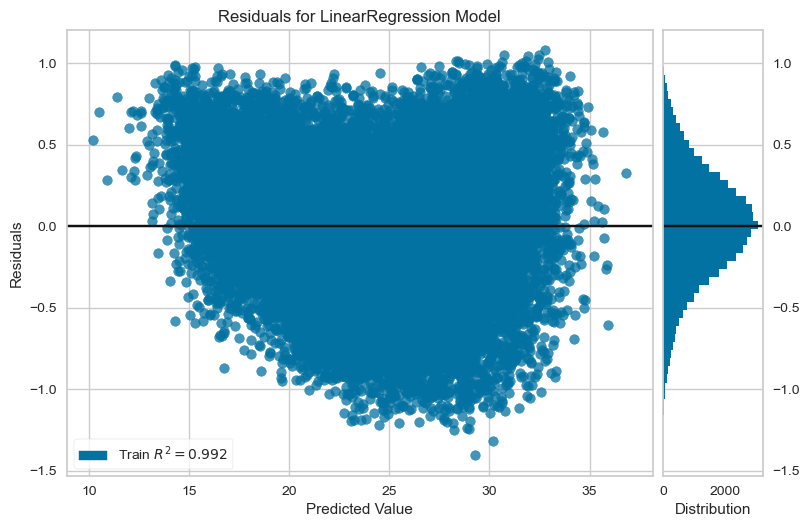

<Axes: title={'center': 'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [62]:
model = LinearRegression()
visualizer_residuals = ResidualsPlot(model)
visualizer_residuals.fit(X_li, y_li)
visualizer_residuals.show()

In [70]:
with open('pipeline.pkl', 'wb') as file:
    pickle.dump(pipeline, file)